# Hands-on Activity 11.1 Linear Regression Analysis

---

**Name**: Cuadra, Audrick Zander G.

**Section**: CPE22S3

**Date**: April 24, 2024

---


## Objective(s):
- cThis activity aims to demonstrate how to apply simple linear regression analysis to solve regression problem

## Intended Learning Outcomes (ILOs):
- Demonstrate how to solve regression problems using simple linear regression
- Use the linear regression model to predict the target value

## Resources:
- Jupyter Notebook

## Files:
- Life Expectancy Data.

## Submission Requirements:
- PDF containing initial EDA and Data Wrangling
- PDF showing demonstration of simple linear regression.
- Submit a link to the colab file through the comment section.

In [295]:
import pandas as pd
import numpy as np

led_df = pd.read_csv("/content/Life Expectancy Data.csv")
led_df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [296]:
def countDup(data):
    if data.duplicated().any():
        return data.duplicated().sum()
    else:
        return "No Duplicates Found!"

In [297]:
countDup(led_df)

'No Duplicates Found!'

In [298]:
led_df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [299]:
led_df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [300]:
def rem_null(data):
    for i in data.columns:
        if data[i].dtype != 'object':
           data[i].fillna(method='ffill', inplace=True)

In [301]:
rem_null(led_df)

In [302]:
led_df.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

In [303]:
led_df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [304]:
led_df.rename(columns={'Life expectancy ': 'Life expectancy'}, inplace=True)

In [305]:
led_df.rename(columns={'Measles ': 'Measles'}, inplace=True)

In [306]:
led_df.rename(columns={' BMI ': 'BMI'}, inplace=True)

In [307]:
led_df.rename(columns={'under-five deaths ': 'under-five deaths'}, inplace=True)

In [308]:
led_df.rename(columns={'Diphtheria ': 'Diphtheria'}, inplace=True)

In [309]:
led_df.rename(columns={' thinness  1-19 years': 'thinness  1-19 years'}, inplace=True)

In [310]:
led_df.rename(columns={' thinness 5-9 years': 'thinness 5-9 years'}, inplace=True)

In [311]:
led_df.rename(columns={' HIV/AIDS': 'HIV/AIDS'}, inplace=True)

In [312]:
led_df.isnull().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
BMI                                0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
thinness  1-19 years               0
thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64

In [313]:
led_cat = led_df.copy()

In [314]:
def preprocessing(data, catlist):
    if data[catlist].dtypes == 'object':
        cat_val = data[catlist].unique()
        range_val = range(1, len(cat_val)+1)
        map = dict(zip(cat_val, range_val))
        print(f"{catlist}:", map)
        data[catlist] = data[catlist].map(map)
    return data
for i in led_df.select_dtypes(include=['object']).columns:
    preprocessing(led_df, i)

Country: {'Afghanistan': 1, 'Albania': 2, 'Algeria': 3, 'Angola': 4, 'Antigua and Barbuda': 5, 'Argentina': 6, 'Armenia': 7, 'Australia': 8, 'Austria': 9, 'Azerbaijan': 10, 'Bahamas': 11, 'Bahrain': 12, 'Bangladesh': 13, 'Barbados': 14, 'Belarus': 15, 'Belgium': 16, 'Belize': 17, 'Benin': 18, 'Bhutan': 19, 'Bolivia (Plurinational State of)': 20, 'Bosnia and Herzegovina': 21, 'Botswana': 22, 'Brazil': 23, 'Brunei Darussalam': 24, 'Bulgaria': 25, 'Burkina Faso': 26, 'Burundi': 27, "Côte d'Ivoire": 28, 'Cabo Verde': 29, 'Cambodia': 30, 'Cameroon': 31, 'Canada': 32, 'Central African Republic': 33, 'Chad': 34, 'Chile': 35, 'China': 36, 'Colombia': 37, 'Comoros': 38, 'Congo': 39, 'Cook Islands': 40, 'Costa Rica': 41, 'Croatia': 42, 'Cuba': 43, 'Cyprus': 44, 'Czechia': 45, "Democratic People's Republic of Korea": 46, 'Democratic Republic of the Congo': 47, 'Denmark': 48, 'Djibouti': 49, 'Dominica': 50, 'Dominican Republic': 51, 'Ecuador': 52, 'Egypt': 53, 'El Salvador': 54, 'Equatorial Guinea

In [315]:
led_df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,1,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,1,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,1,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,1,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,1,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


<Axes: >

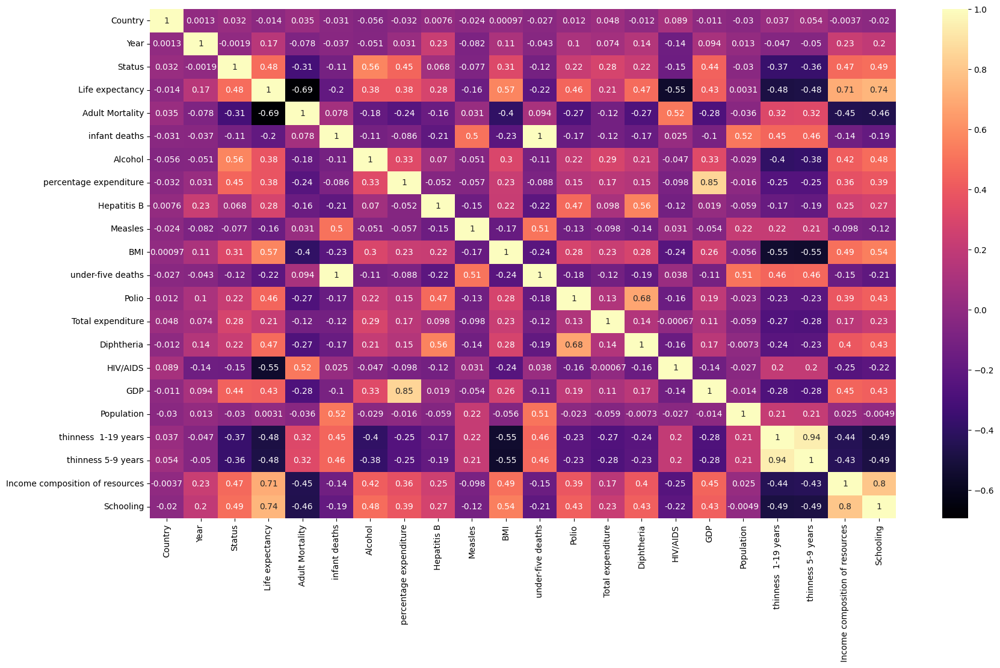

In [316]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20,11))
sns.heatmap(led_df.corr(), annot=True, cmap='magma')

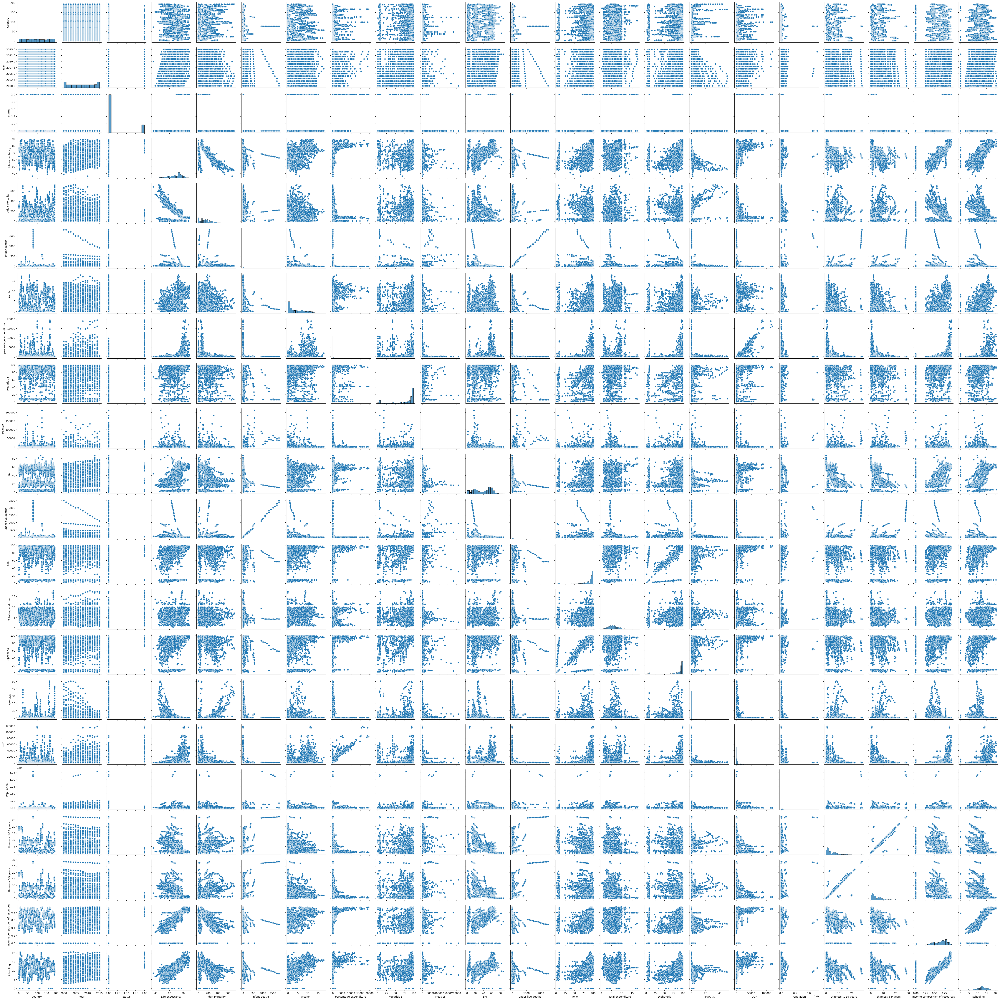

In [227]:
sns.pairplot(led_df)

## Linear Regression Model

In [317]:
X = led_df.drop('BMI', axis=1)
y = led_df['BMI']

In [318]:
print("X",X.shape,"\ny=",y.shape)

X (2938, 21) 
y= (2938,)


## Train Test Splitting

In [289]:
!pip install scikit-learn

In [319]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression

In [320]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [321]:
X_train.shape

(2056, 21)

In [322]:
X_test.shape

(882, 21)

In [323]:
model = LinearRegression()

In [324]:
model.fit(X_train, y_train)

LinearRegression()

## Model Evaluation

In [325]:
model.coef_

array([ 7.57056771e-03, -4.63411687e-02, -2.07939848e+00,  5.56411501e-01,
       -6.24185007e-03, -3.41735872e-03, -1.14684826e-01,  3.06103000e-04,
        2.83703325e-02, -1.07978944e-04,  9.05328887e-03, -7.11044654e-04,
        3.56594950e-01, -1.75437562e-02,  1.36511969e-01, -8.45656970e-05,
        6.05489000e-09, -4.91879831e-01, -1.07257902e+00,  4.62048803e+00,
        1.01030665e+00])

In [327]:
pd.DataFrame(model.coef_, X.columns, columns=['Coedicients'])

,Coedicients
Country,7.570568e-03
Year,-4.634117e-02
Status,-2.079398e+00
Life expectancy,5.564115e-01
Adult Mortality,-6.241850e-03
infant deaths,-3.417359e-03
Alcohol,-1.146848e-01
percentage expenditure,3.061030e-04
Hepatitis B,2.837033e-02
Measles,-1.079789e-04


## Predictions from our Model

In [328]:
y_pred = model.predict(X_test)

## Regression Evaluation Metrics

In [329]:
MAE = metrics.mean_absolute_error(y_test, y_pred)
MSE = metrics.mean_squared_error(y_test, y_pred)
RMSE = np.sqrt(MSE)

In [330]:
MAE

10.684448166792613

In [331]:
MSE

212.90158397376152

In [332]:
RMSE

14.591147452265758

In [333]:
led_df['BMI'].mean()

38.02014976174268

## Residual Histogram

In [334]:
test_residual = y_test - y_pred

<Axes: ylabel='Density'>

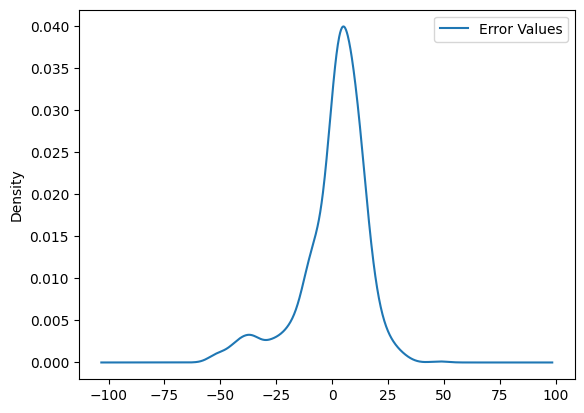

In [339]:
pd.DataFrame({'Error Values': (test_residual)}).plot.kde()

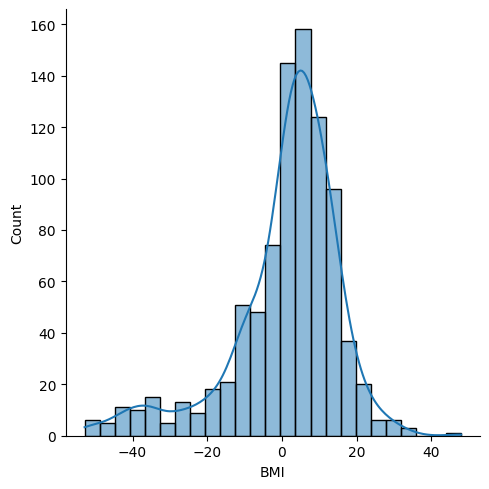

In [340]:
sns.displot(test_residual, bins=25, kde=True)

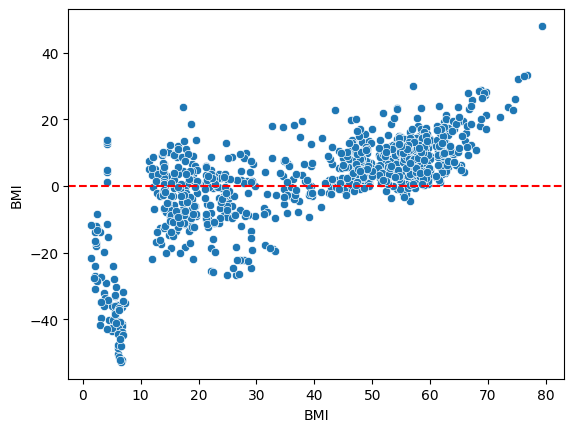

In [341]:
sns.scatterplot(x=y_test, y=test_residual)

plt.axhline(y=0, color='r', ls='--')

## Summary

- The regression is valid due to the values it contains is near zero, which means is the mean of absolute error. This test if the dataset is really valid.